# Test functions for single-objective optimization

In [1]:
import matplotlib.pyplot as plt
from numpy import *
from pylab import *
%matplotlib notebook

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.cm import inferno as colormap
from matplotlib.colors import LogNorm, Normalize
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")

'''
3D plot
'''
def plot3D(func, x_range, log_norm=False, interaction=False, s=0):
    fig = plt.figure()
    fig.clf()
    ax = Axes3D(fig, azim=-128.0, elev=43.0)
    
    if s==0:
        s = (amax(x_range)-amin(x_range))/100
    x1 = arange(x_range[0][0], x_range[0][1] + s, s)
    x2 = arange(x_range[1][0], x_range[1][1] + s, s)
    x = meshgrid(x1, x2)
    f = func(x)
    
    if log_norm:
        norm = LogNorm()
    else:
        norm = Normalize()
    ax.plot_surface(x[0], x[1], f, rstride=1, cstride=1, norm=norm,
                    cmap=colormap, linewidth=0, edgecolor='none', alpha=1)

    ax.set_xlim([min(x1), max(x1)])
    ax.set_ylim([min(x2), max(x2)])
    ax.set_zlim([amin(f), amax(f)])

    ax.set_xlabel("x")
    ax.set_ylabel("y")

    plt.show()

## Rosenbrock function
$f($x$) = \sum_{i=1}^{n-1}[100(x_{i+1}-x_i^2)^2 + (x_i-1)^2]$

$f(1,1) = 0$

<IPython.core.display.Javascript object>


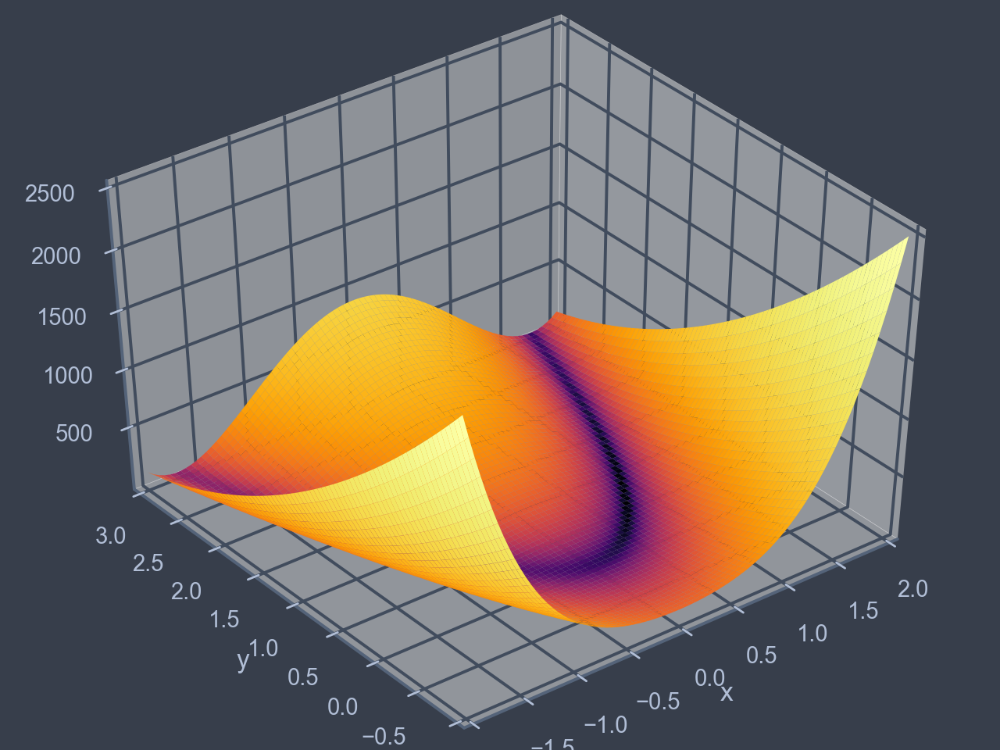

In [2]:
rosen = lambda x: sum([100*(x[i+1]-x[i]**2)**2 + (x[i]-1)**2 for i in range(shape(x)[0]-1)], axis=0)

plot3D(rosen, [(-2,2), (-1,3)], log_norm=True, interaction=True)

## Sphere function
$f($x$) = \sum_{i=1}^{n}x_i^2$

$f(0,0) = 0$

<IPython.core.display.Javascript object>


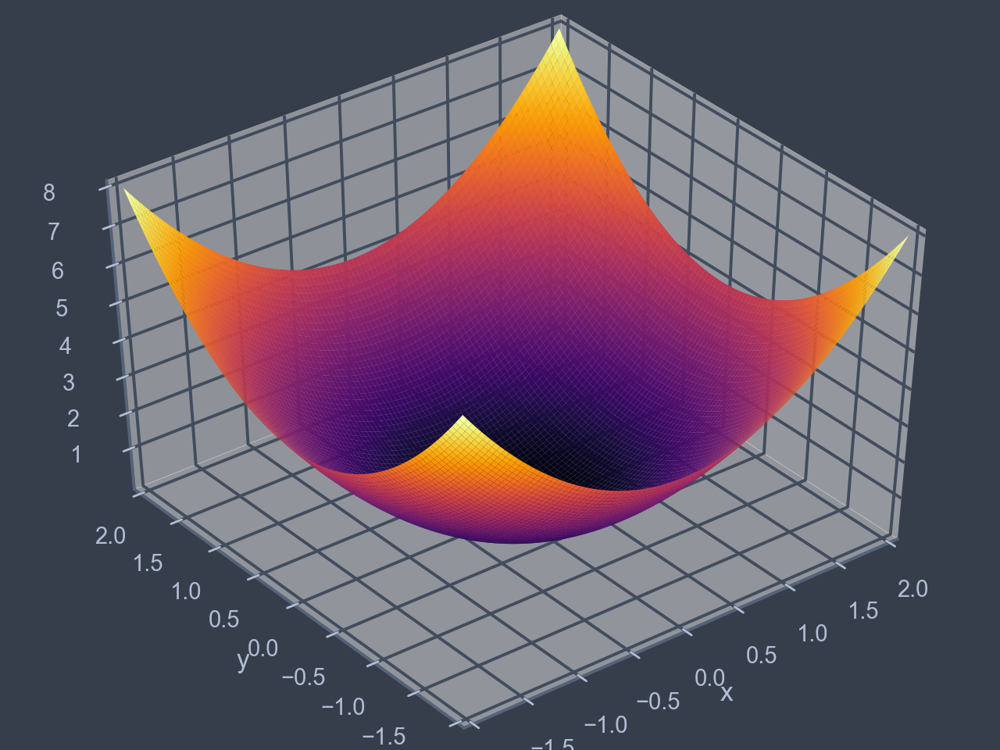

In [3]:
sphere = lambda x: sum([v**2 for v in x], axis=0)

plot3D(sphere, [(-2,2), (-2,2)])

## McCormick function
$f(x,y) = sin(x+y) + (x-y)^2 -1.5x+2.5y+1$

$f(-0.54719,-1.54719) = -1.9133$

<IPython.core.display.Javascript object>


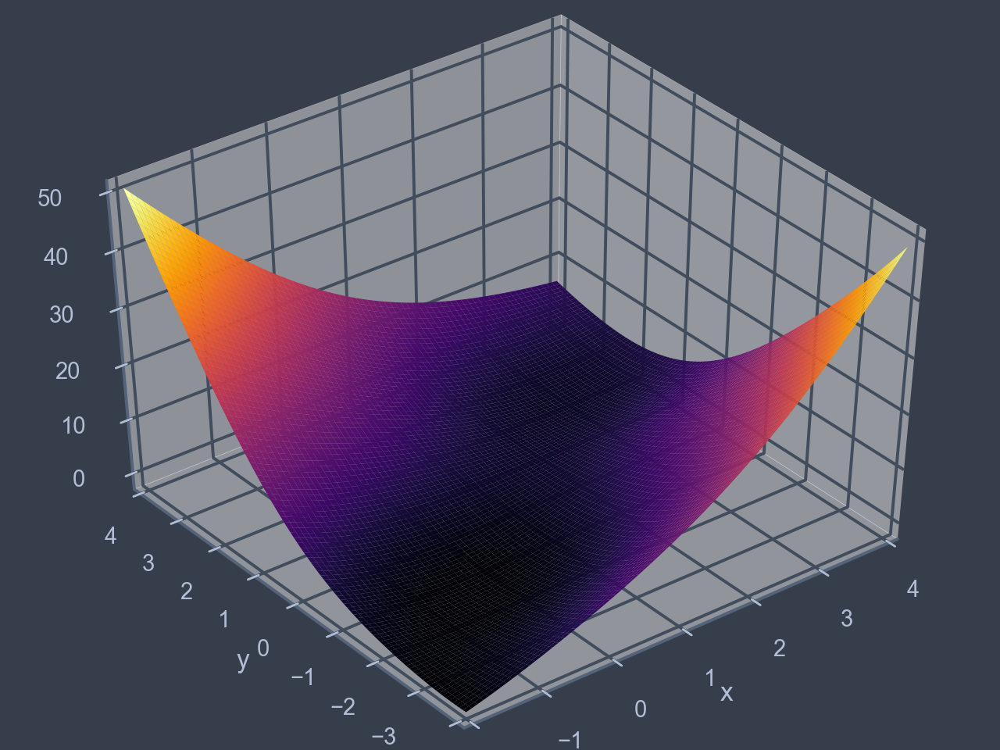

In [4]:
mccormick = lambda x: sin(x[0]+x[1]) + (x[0]-x[1])**2 - 1.5*x[0] + 2.5*x[1] + 1

plot3D(mccormick, [(-2,4), (-4,4)])

## Styblinski–Tang function
$f($x$) = \frac{1}{2}\sum_{i=1}^{n}x_i^4 - 16x_i^2 + 5x_i$

$-39.16617n < f(-2.903534,..,-2.903534) < -39.16616n$

<IPython.core.display.Javascript object>


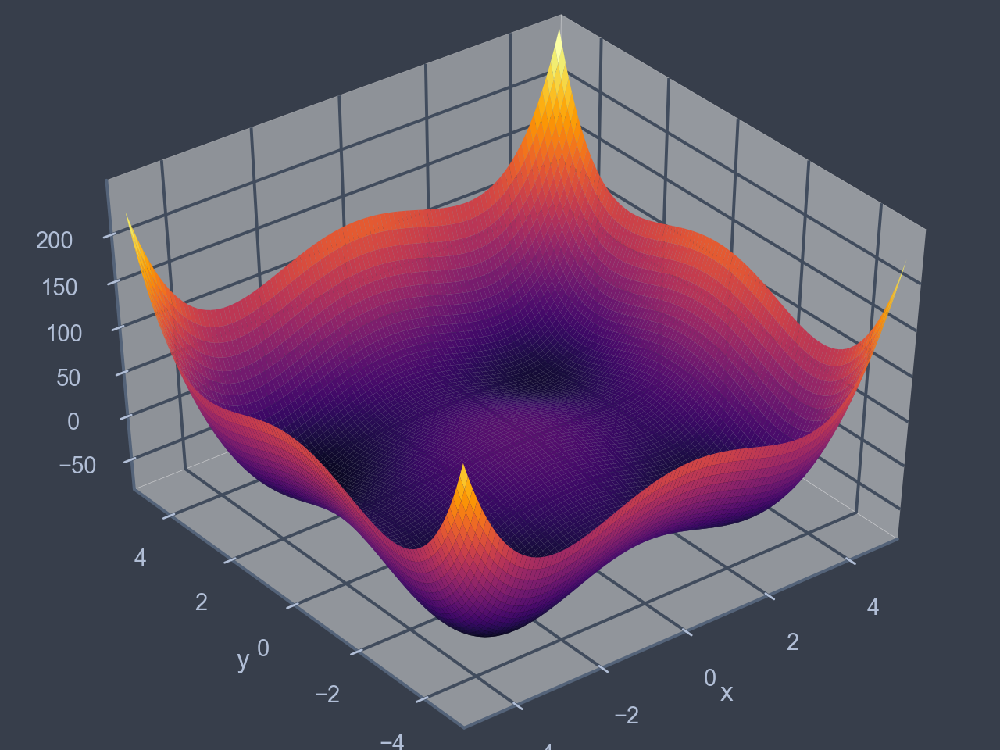

In [5]:
tang = lambda x: sum([v**4 -16*v**2 + 5*v for v in x], axis=0)/2

plot3D(tang, [(-5,5), (-5,5)])

## Three-hump camel function
$f(x,y) = 2x^2 - 1.05x^4 + \frac{x^6}{6} + xy + y^2$

$f(0,0) = 0$

<IPython.core.display.Javascript object>


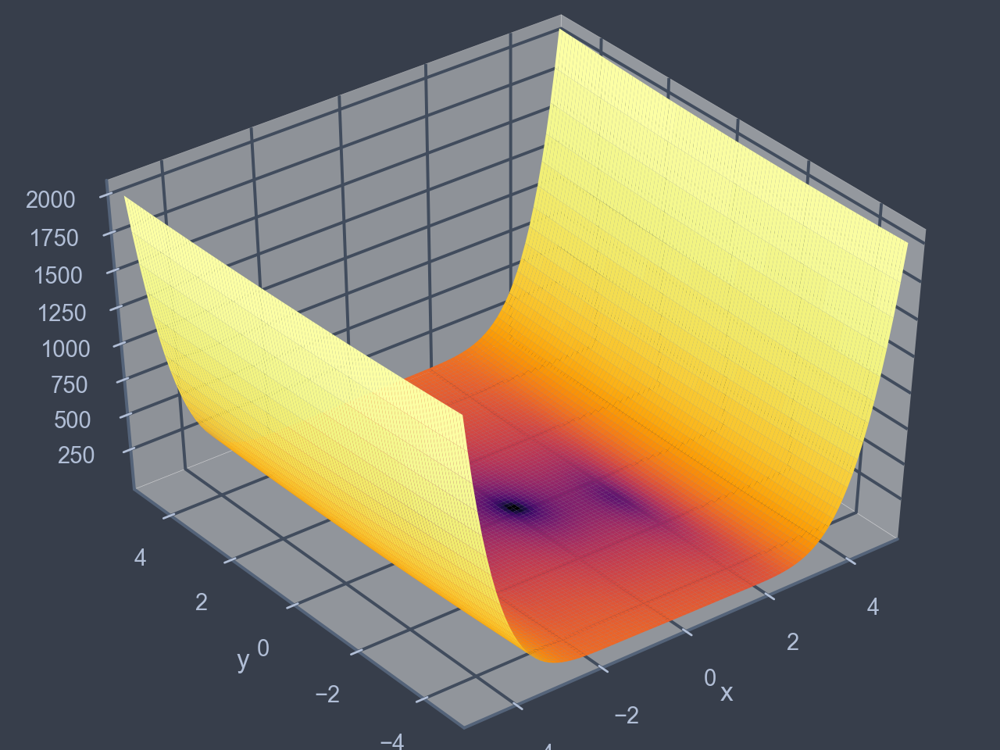

In [6]:
three_hump = lambda x: 2*x[0]**2 -1.05*x[0]**4 + x[0]**6/6 + x[0]*x[1] + x[1]**2

plot3D(three_hump, [(-5,5), (-5,5)], log_norm=True)

## Lévi function N.13
$f(x,y) = sin^2(3\pi x) + (x-1)^2(1+sin^2(3\pi y) + (y-1)^2(1+sin^2(2\pi y))$

$f(1,1) = 0$

<IPython.core.display.Javascript object>


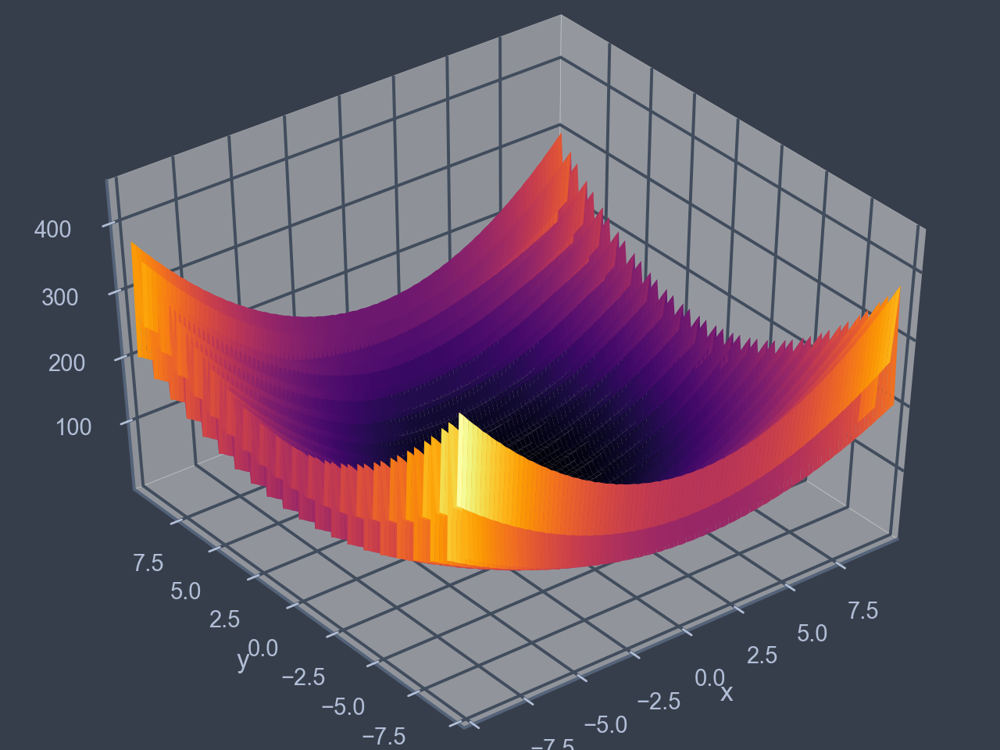

In [7]:
sqn = lambda x: sin(x*pi)**2
levi13 = lambda x: sqn(3*x[0]) + (1+sqn(3*x[1]))*(x[0]-1)**2 + (1+sqn(2*x[1]))*(x[1]-1)**2

plot3D(levi13, [(-10,10), (-10,10)])

## Beale's function
$f(x,y) = (1.5-x+xy)^2 + (2.25-x+xy^2)^2 + (2.625-x+xy^3)^2$

$f(3,0.5) = 0$

<IPython.core.display.Javascript object>


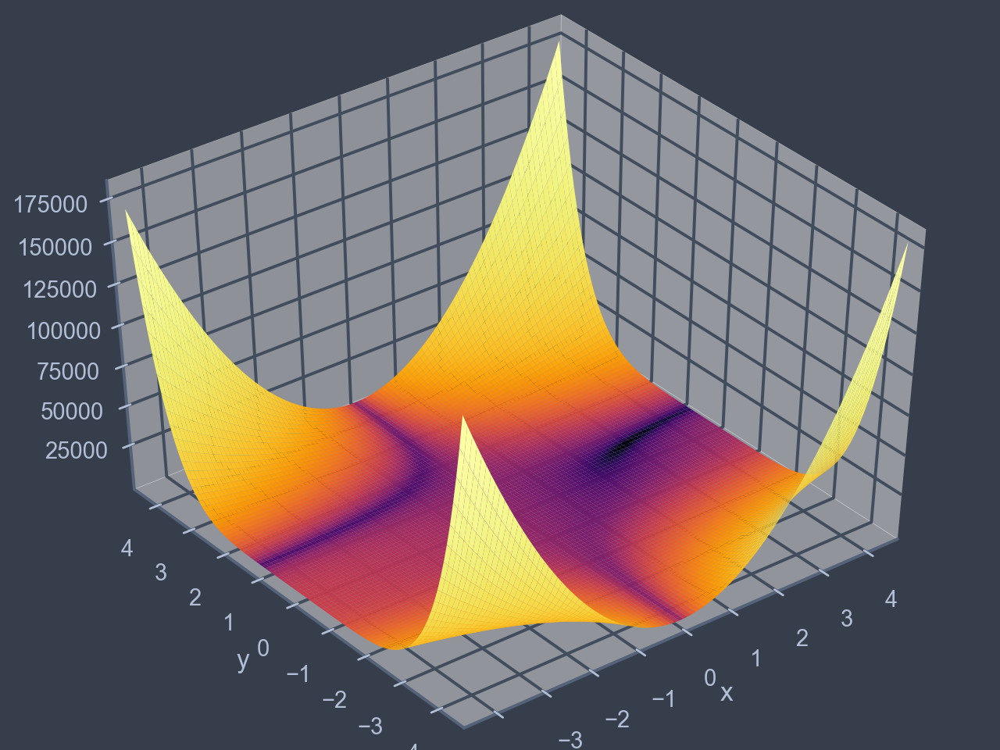

In [8]:
beale = lambda x: (1.5-x[0]+x[0]*x[1])**2 + (2.25-x[0]+x[0]*x[1]**2)**2 + \
(2.625-x[0]+x[0]*x[1]**3)**2

plot3D(beale, [(-4.5,4.5), (-4.5,4.5)], log_norm=True)

## Beale's function
$f(x,y) = [1+(x+y+1)^2(19-14x+3x^2-14y+6xy+3y^2)]\\ [30+(2x-3y)^2(18-32x+12x^2+48y-36xy+27y^2)]$

$f(0,-1) = 3$

<IPython.core.display.Javascript object>


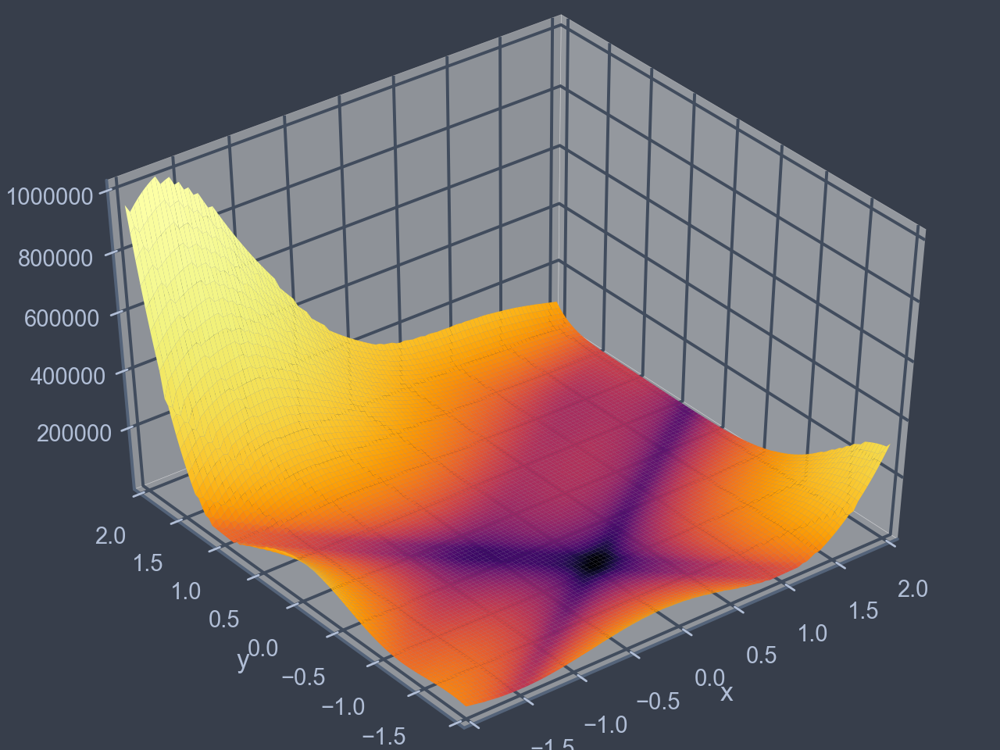

In [9]:
goldstein = lambda x: vectorize(int)(1+(x[0]+x[1]+1)**2*(19-14*x[0]+3*x[0]**2-14*x[1]+6*x[0]*x[1]+3*x[1]**2))\
*vectorize(int)(30+(2*x[0]-3*x[1])**2*(18-32*x[0]+12*x[0]**2+48*x[1]-36*x[0]*x[1]+27*x[1]**2))

plot3D(goldstein, [(-2,2), (-2,2)], log_norm=True)

## Bukin function N.6
$f(x,y) = 100\sqrt{\mid{y-0.01x^2}\mid}+0.01\mid{x+10}\mid$

$f(-10,1) = 0$

<IPython.core.display.Javascript object>


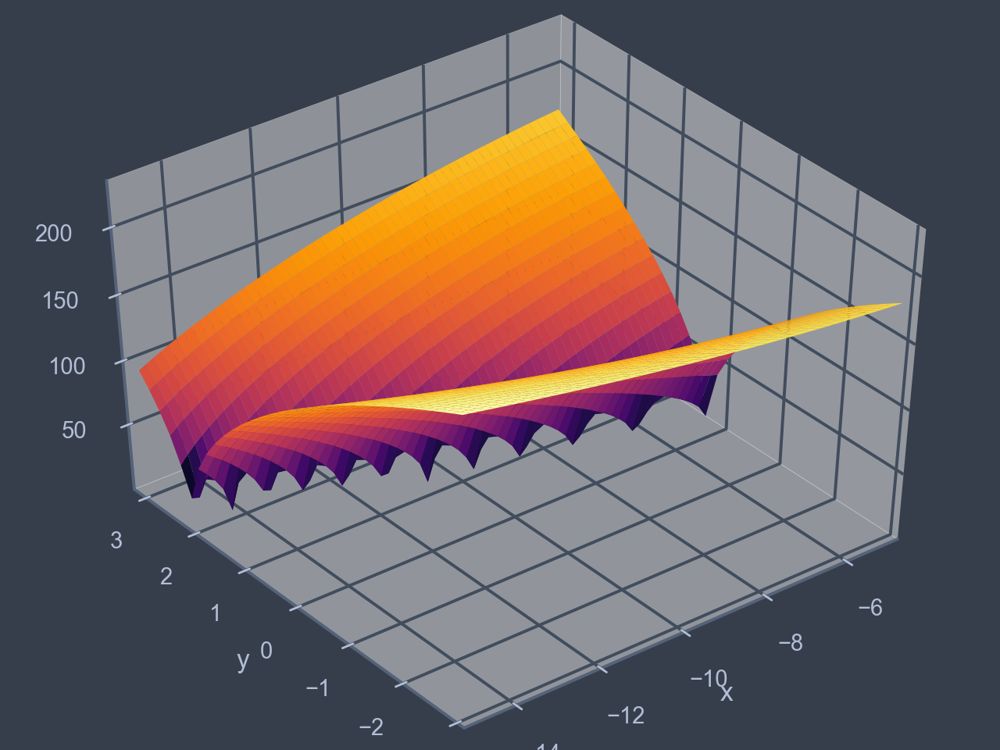

In [10]:
bukin = lambda x: 100*sqrt(abs(x[1]-0.01*x[0]**2))+0.01*abs(x[0]+10)

plot3D(bukin, [(-15,-5), (-3,3)], log_norm=True)

## Matyas function
$f(x,y) = 0.26(x^2+y^2) - 0.48xy$

$f(0,0) = 0$

<IPython.core.display.Javascript object>


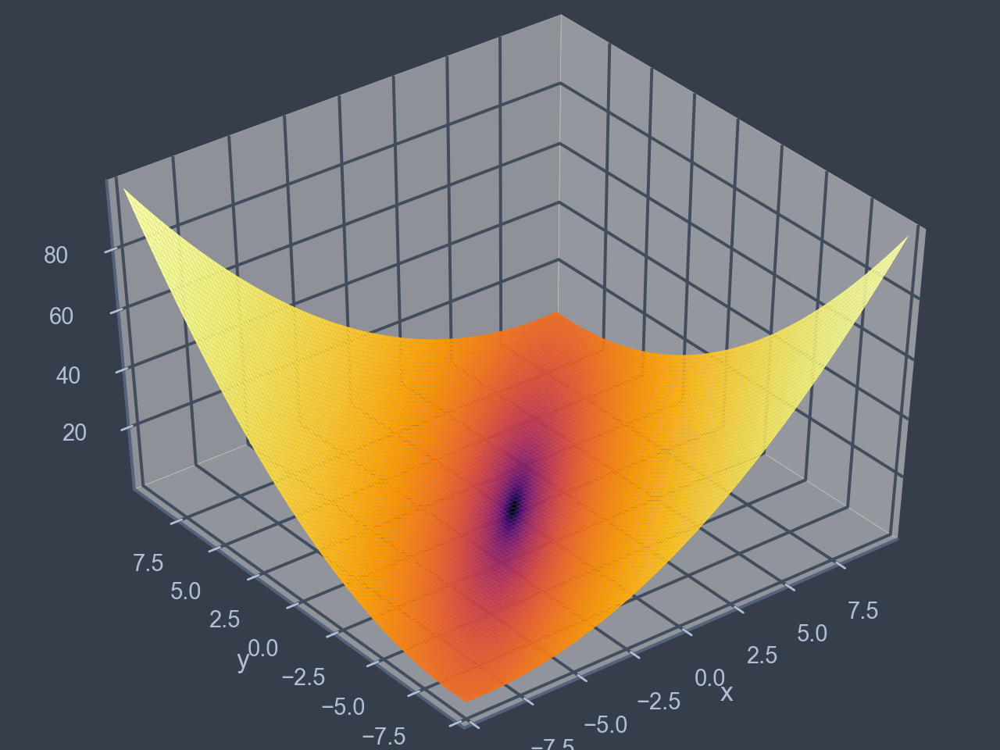

In [11]:
matyas = lambda x: 0.26*(x[0]**2+x[1]**2)-0.48*x[0]*x[1]

plot3D(matyas, [(-10,10), (-10,10)], log_norm=True)

## Booth's function
$f(x,y) = (x+2y+5)^2 + (2x+y+7)^2$

$f(-3,-1) = 0$

<IPython.core.display.Javascript object>


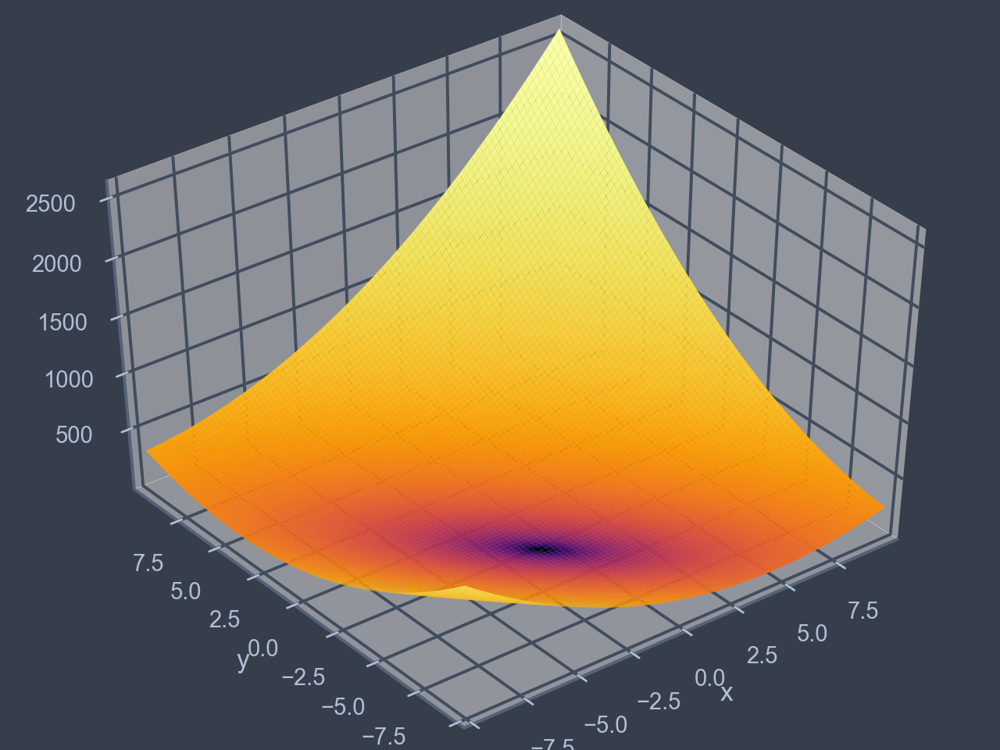

In [12]:
booth = lambda x: (x[0]+2*x[1]+7)**2 + (2*x[0]+x[1]+5)**2

plot3D(booth, [(-10,10), (-10,10)], log_norm=True)

## Eggholder function
$f(x,y) = 1000-y\sin\sqrt{\mid \frac{x}{2}+y\mid}-x \sin \sqrt{\mid x-y\mid}$

$f(512,451.2319) = 40.3593$

<IPython.core.display.Javascript object>


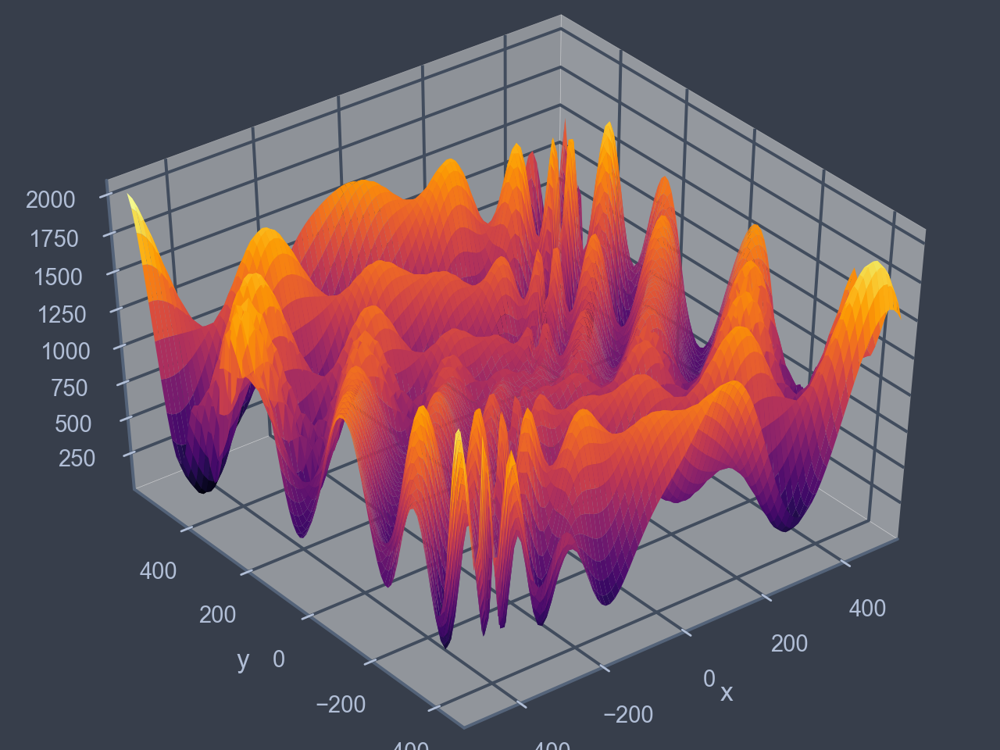

In [15]:
eggholder = lambda x: 1000-x[1]*sin(absolute(x[0]/2+x[1])**0.5)-x[0]*sin(absolute(x[0]-x[1])**0.5)

plot3D(eggholder, [(-512,512), (-465,559)])

## Easom function
$f(x,y) = -\cos(x)\cos(y)\exp(-(x-\pi)^2-(y-\pi)^2)$

$f(\pi,\pi) = -1$

<IPython.core.display.Javascript object>


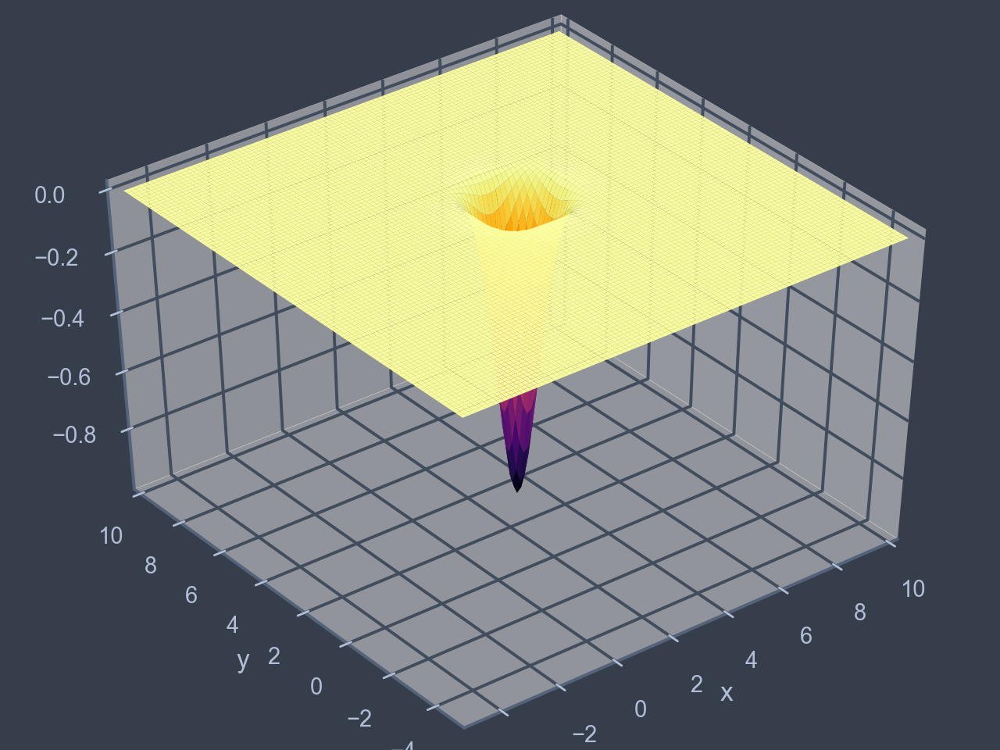

In [21]:
easom = lambda x: -cos(x[0])*cos(x[1])*exp(-(x[0]-pi)**2-(x[1]-pi)**2)

plot3D(easom, [(-5,10), (-5,10)])

## Cross-in-tray function
$f(x,y) = -0.0001\Big[\Big|{\sin(x)\sin(y)\exp\Big(\Big|100-\frac{\sqrt{x^2+y^2}}{\pi}\Big|\Big)\Big|}+1\Big]^{0.1}$

$f(-1.34941,-1.34941) = -2.06261$

$f( 1.34941,-1.34941) = -2.06261$

$f(-1.34941, 1.34941) = -2.06261$

$f(1.34941, 1.34941) = -2.06261$

<IPython.core.display.Javascript object>


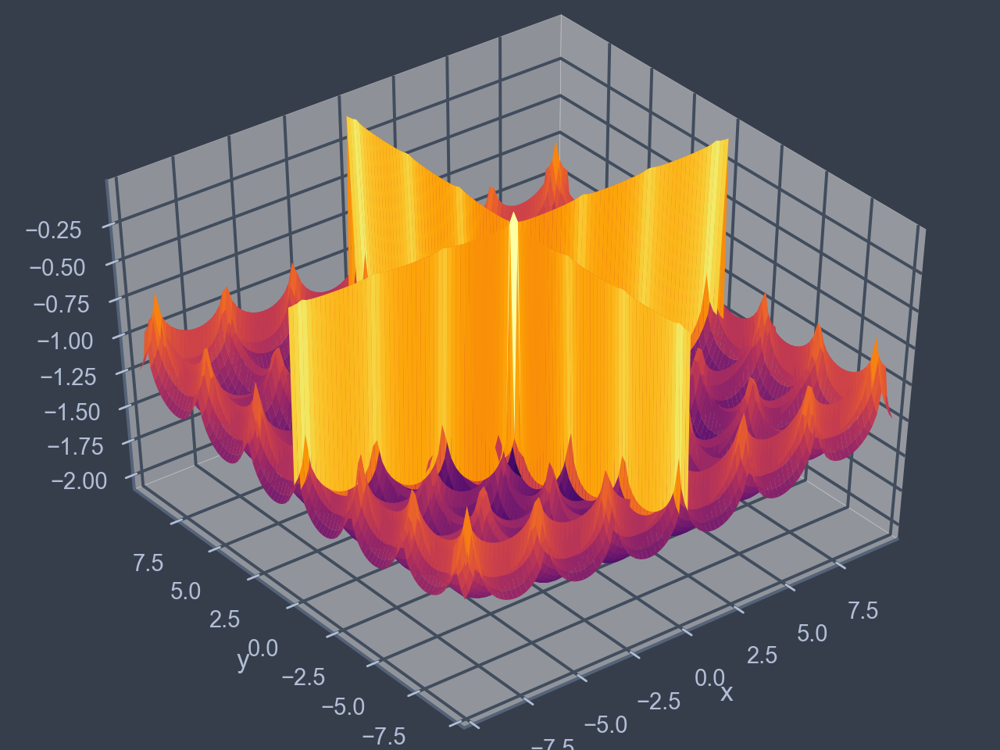

In [39]:
cross = lambda x: -0.0001*(abs(sin(x[0])*sin(x[1])*exp(abs(100-sqrt(x[0]**2+x[1]**2)/pi)))+1)**0.1

plot3D(cross, [(-10,10), (-10,10)])

## Cross-in-tray function N.2
$f(x,y) = 0.0001\Big[\Big|{\sin(x)\sin(y)\exp\Big(\Big|100-\frac{\sqrt{x^2+y^2}}{\pi}\Big|\Big)\Big|}+1\Big]^{0.1}$

$f(0,0) = 0.0001$

<IPython.core.display.Javascript object>


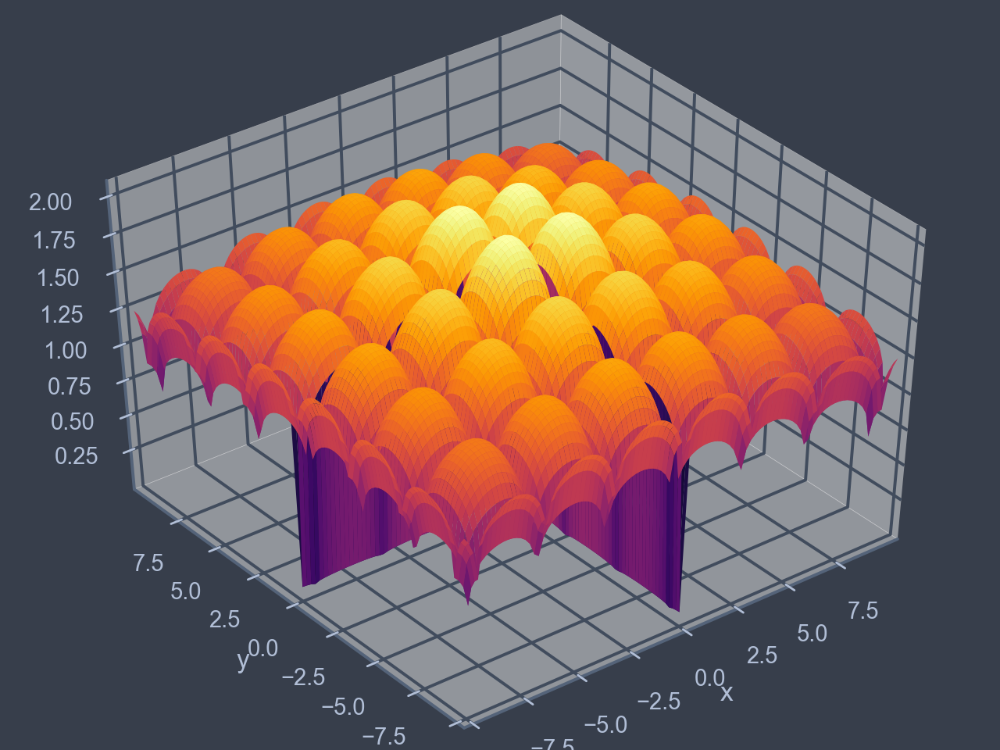

In [40]:
rcross = lambda x: 0.0001*(abs(sin(x[0])*sin(x[1])*exp(abs(100-sqrt(x[0]**2+x[1]**2)/pi)))+1)**0.1

plot3D(rcross, [(-10,10), (-10,10)])

## Ackley's function
$f(x,y) = -20\exp[-0.2\sqrt{0.5(x^2+y^2)}]-\exp[0.5(\cos{2\pi x}+\cos{2\pi y})] + e + 20$

$f(0,0) = 0$

<IPython.core.display.Javascript object>


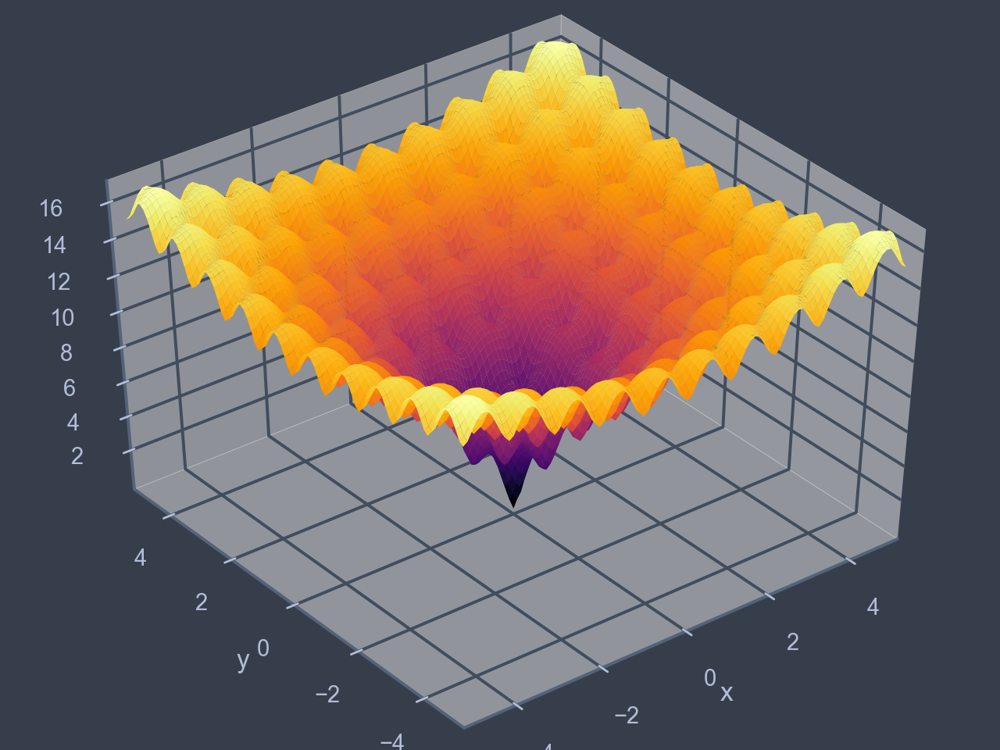

In [43]:
ackley = lambda x: -20*exp(-0.2*sqrt(x[0]**2+x[1]**2))-\
exp(cos(2*pi*x[0])/2+cos(2*pi*x[1])/2) + exp(1) + 20

plot3D(ackley, [(-5,5), (-5,5)])

## Rastrigin function
$f($x$) = An + \sum_{i=1}^n{[x_i^2-A\cos{(2\pi x_i)}]}$

$f(0,..,0) = 0$

<IPython.core.display.Javascript object>


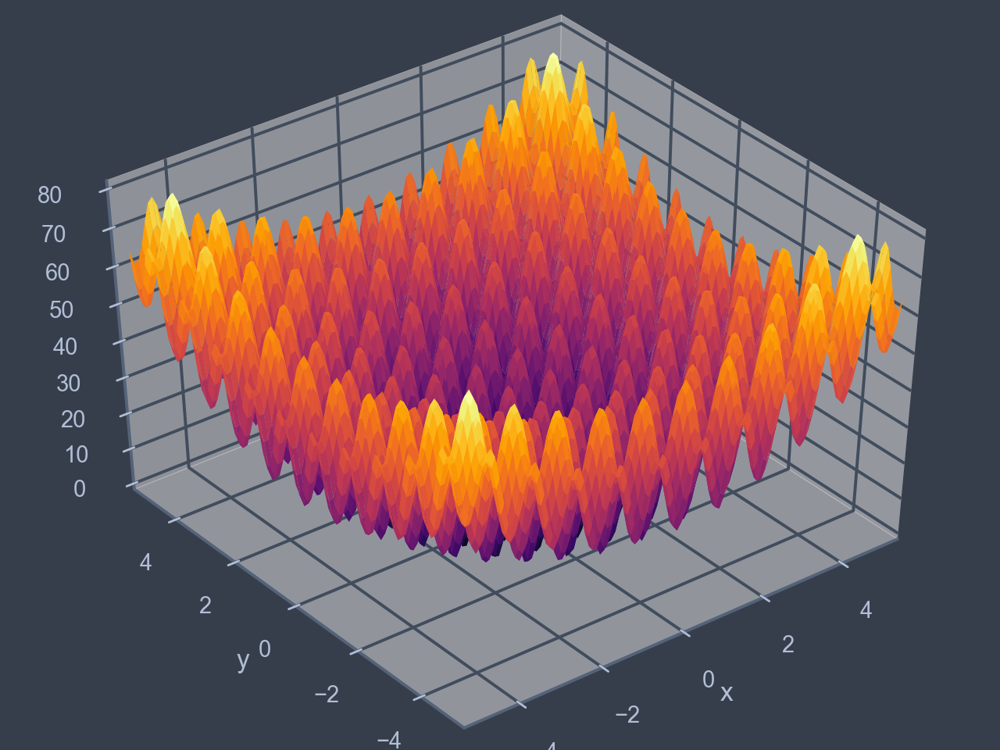

In [45]:
rastrigin = lambda x,A=10: A*len(x)+sum([v**2-A*cos(2*pi*v) for v in x],axis=0)

plot3D(rastrigin, [(-5.12,5.12), (-5.12,5.12)])